TASK 4 - Exploratory Data Analysis- Terorrism

Performing Exploratory Data Analysis on dataset ‘Globalterorrism’.

Author - Neha Bansode

In [1]:
#Importing all necessary libraries
import math
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.offline as py
import plotly.graph_objs as go
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')

In [2]:
#Reading the csv file
df = pd.read_csv("Globalterorrism.csv",encoding='latin1')
df.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [3]:
#"Retrieving Column Names from a DataFrame"
df.columns.values

array(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region', 'region_txt',
       'provstate', 'city', 'latitude', 'longitude', 'specificity',
       'vicinity', 'location', 'summary', 'crit1', 'crit2', 'crit3',
       'doubtterr', 'alternative', 'alternative_txt', 'multiple',
       'success', 'suicide', 'attacktype1', 'attacktype1_txt',
       'attacktype2', 'attacktype2_txt', 'attacktype3', 'attacktype3_txt',
       'targtype1', 'targtype1_txt', 'targsubtype1', 'targsubtype1_txt',
       'corp1', 'target1', 'natlty1', 'natlty1_txt', 'targtype2',
       'targtype2_txt', 'targsubtype2', 'targsubtype2_txt', 'corp2',
       'target2', 'natlty2', 'natlty2_txt', 'targtype3', 'targtype3_txt',
       'targsubtype3', 'targsubtype3_txt', 'corp3', 'target3', 'natlty3',
       'natlty3_txt', 'gname', 'gsubname', 'gname2', 'gsubname2',
       'gname3', 'gsubname3', 'motive', 'guncertain1', 'guncertain2',
       'guncertain3', 'in

In [4]:
#Renaming Columns in a DataFrame for Clarity and Consistency
df.rename(columns={'iyear':'Year','imonth':'Month','iday':"day",'gname':'Group','country_txt':'Country','region_txt':'Region','provstate':'State','city':'City','latitude':'latitude',
    'longitude':'longitude','summary':'summary','attacktype1_txt':'Attacktype','targtype1_txt':'Targettype','weaptype1_txt':'Weapon','nkill':'kill',
     'nwound':'Wound'},inplace=True)

In [5]:
df = df[['Year','Month','day','Country','State','Region','City','latitude','longitude',"Attacktype",'kill',
               'Wound','target1','summary','Group','Targettype','Weapon','motive']]

In [6]:
df.shape

(181691, 18)

In [7]:
df.isnull().sum()

Year               0
Month              0
day                0
Country            0
State            421
Region             0
City             435
latitude        4556
longitude       4557
Attacktype         0
kill           10313
Wound          16311
target1          638
summary        66129
Group              0
Targettype         0
Weapon             0
motive        131130
dtype: int64

In [8]:
#Handling Missing Values in 'Wound' and 'kill' Columns of a DataFrame
df['Wound'] = df['Wound'].fillna(0)
df['kill'] = df['kill'].fillna(0)

In [9]:
#Calculating Total Casualties by Summing Kills and Wounds in a DataFrame
df['Casualities'] = df['kill'] + df['Wound']

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 19 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Year         181691 non-null  int64  
 1   Month        181691 non-null  int64  
 2   day          181691 non-null  int64  
 3   Country      181691 non-null  object 
 4   State        181270 non-null  object 
 5   Region       181691 non-null  object 
 6   City         181256 non-null  object 
 7   latitude     177135 non-null  float64
 8   longitude    177134 non-null  float64
 9   Attacktype   181691 non-null  object 
 10  kill         181691 non-null  float64
 11  Wound        181691 non-null  float64
 12  target1      181053 non-null  object 
 13  summary      115562 non-null  object 
 14  Group        181691 non-null  object 
 15  Targettype   181691 non-null  object 
 16  Weapon       181691 non-null  object 
 17  motive       50561 non-null   object 
 18  Casualities  181691 non-

In [11]:
df.describe()

,Year,Month,day,latitude,longitude,kill,Wound,Casualities
count,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181691.000000,181691.000000,181691.000000
mean,2002.638997,6.467277,15.505644,23.498343,-4.586957e+02,2.266860,2.883296,5.150156
std,13.259430,3.388303,8.814045,18.569242,2.047790e+05,11.227057,34.309747,40.555416
min,1970.000000,0.000000,0.000000,-53.154613,-8.618590e+07,0.000000,0.000000,0.000000
25%,1991.000000,4.000000,8.000000,11.510046,4.545640e+00,0.000000,0.000000,0.000000
50%,2009.000000,6.000000,15.000000,31.467463,4.324651e+01,0.000000,0.000000,1.000000
75%,2014.000000,9.000000,23.000000,34.685087,6.871033e+01,2.000000,2.000000,4.000000
max,2017.000000,12.000000,31.000000,74.633553,1.793667e+02,1570.000000,8191.000000,9574.000000


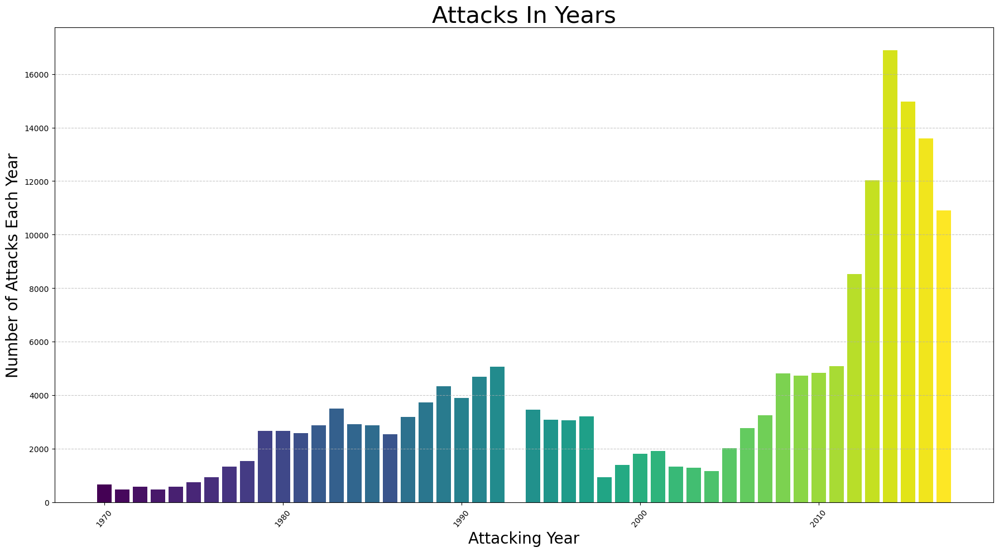

In [12]:
#Annual Trend of Terrorist Attacks Worldwide
year = df['Year'].unique()
years_count = df['Year'].value_counts(dropna=False).sort_index()

palette = plt.cm.get_cmap('viridis', len(years_count))

plt.figure(figsize=(18, 10))
plt.bar(year, years_count, color=palette(range(len(year))))
plt.xticks(rotation=50)
plt.xlabel('Attacking Year', fontsize=20)
plt.ylabel('Number of Attacks Each Year', fontsize=20)
plt.title('Attacks In Years', fontsize=30)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

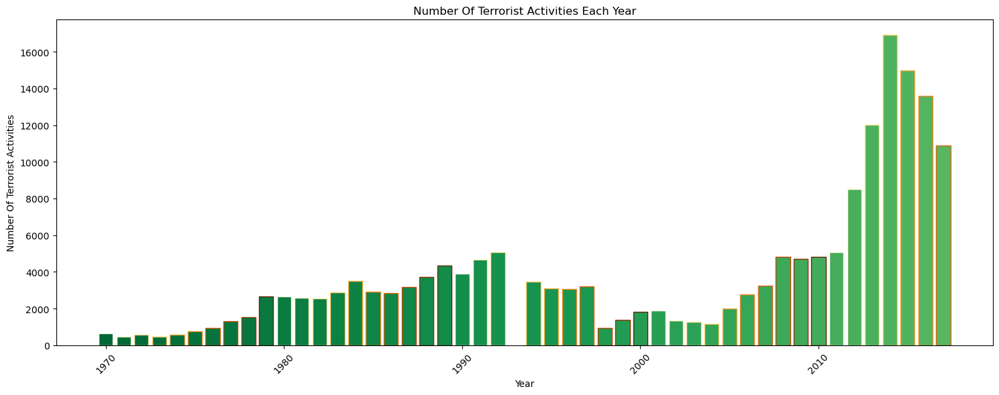

In [13]:
#Annual Trends in Global Terrorist Activities
terrorist_activities_per_year = df['Year'].value_counts().sort_index()
plt.figure(figsize=(15, 6))
plt.bar(terrorist_activities_per_year.index, terrorist_activities_per_year.values, 
        color=plt.cm.get_cmap('RdYlGn_r')(range(len(terrorist_activities_per_year))),
        edgecolor=plt.cm.get_cmap('YlOrBr', 10)(range(10)))
plt.xticks(rotation=45)
plt.title('Number Of Terrorist Activities Each Year')
plt.xlabel('Year')
plt.ylabel('Number Of Terrorist Activities')
plt.tight_layout()
plt.show()

Ploting an area plot showing the distribution of terrorist activities by region for each year.

<Figure size 1500x600 with 0 Axes>

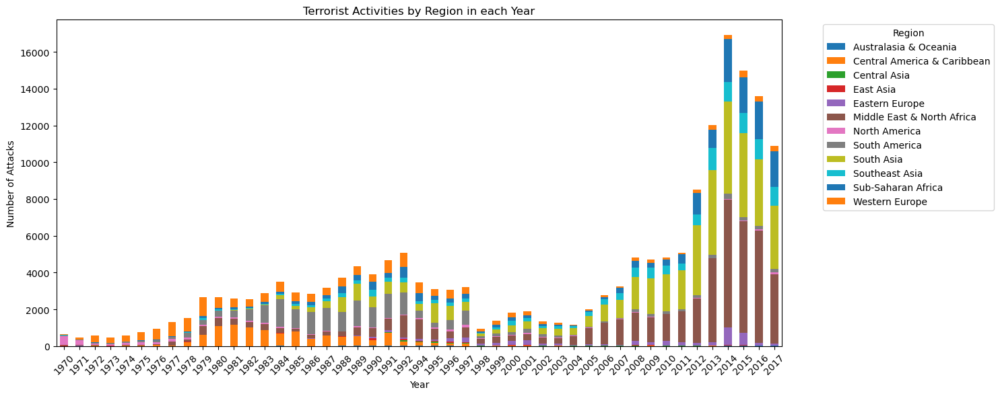

In [14]:
#Annual Trends in Global Terrorism: A Regional Perspective
cross_tab = pd.crosstab(df['Year'], df['Region'])
plt.figure(figsize=(15, 6))
cross_tab.plot(kind='bar', stacked=True, figsize=(15, 6))
plt.title('Terrorist Activities by Region in each Year')
plt.xlabel('Year')
plt.ylabel('Number of Attacks')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [15]:
#Handling Missing Data and Calculating Casualties in a Terrorism Dataset
df['Wound'] = df['Wound'].fillna(0).astype(int)
df['kill'] = df['kill'].fillna(0).astype(int)
df['casualties'] = df['kill'] + df['Wound']

Arranging the values based on the top 40 worst terror attacks to simplify and enhance visualization in the heatmap.

In [16]:
df1 = df.sort_values(by='casualties', ascending=False)[:40]

In [17]:
heat= df1.pivot_table(index='Country',columns='Year',values='casualties')
heat.fillna(0,inplace=True)

In [18]:
heat.head()

Year,1982,1984,1992,1994,1995,1996,1997,1998,2001,2004,2005,2006,2007,2008,2009,2014,2015,2016,2017
Country,,,,,,,,,,,,,,,,,,,
Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,536.0,0.0,584.0
Chad,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1161.0,0.0,0.0,0.0,0.0,0.0
Ethiopia,0.0,0.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
France,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,520.0,0.0
India,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1005.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [19]:
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode(connected=True)
colorscale = [
    [0, '#edf8fb'],
    [0.3, '#00BFFF'],
    [0.6, '#8856a7'],
    [1, '#810f7c']
]
heatmap = go.Heatmap(
    z=heat.values,
    x=heat.columns,
    y=heat.index,
    colorscale=colorscale
)
data = [heatmap]

layout = go.Layout(
    title='Top 40 Worst Terror Attacks in History from 1982 to 2016',
    xaxis=dict(ticks='', nticks=20),
    yaxis=dict(ticks='')
)
fig = go.Figure(data=data, layout=layout)


py.iplot(fig, filename='heatmap', show_link=False)


In [20]:
df.Country.value_counts()[:15]

Country
Iraq              24636
Pakistan          14368
Afghanistan       12731
India             11960
Colombia           8306
Philippines        6908
Peru               6096
El Salvador        5320
United Kingdom     5235
Turkey             4292
Somalia            4142
Nigeria            3907
Thailand           3849
Yemen              3347
Spain              3249
Name: count, dtype: int64

Top Countries affected by Terror Attacks

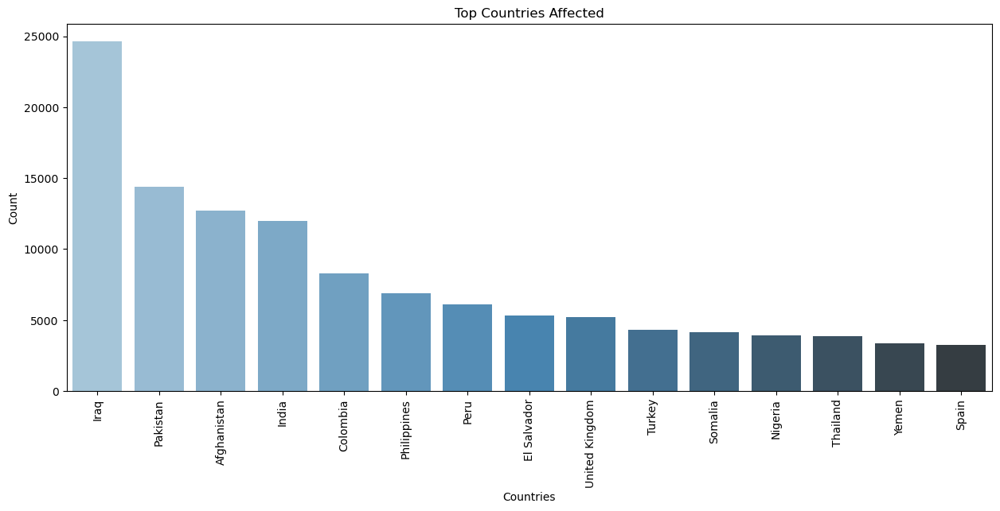

In [21]:
#Top countries affected by terror attacks
import matplotlib.pyplot as plt
import seaborn as sns

top_countries = df['Country'].value_counts().head(15)

plt.figure(figsize=(15, 6))
sns.barplot(x=top_countries.index, y=top_countries.values, palette='Blues_d')
plt.title('Top Countries Affected')
plt.xlabel('Countries')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

# Terrorist Attacks of a Particular year and their Locations

In [22]:
import folium
from folium.plugins import MarkerCluster 

In [23]:
filterYear = df['Year'] == 1970

In [24]:
filterData = df[filterYear] 
reqFilterData = filterData.loc[:,'City':'longitude'] 
reqFilterData = reqFilterData.dropna()
reqFilterDataList = reqFilterData.values.tolist()

In [25]:
map = folium.Map(location = [0, 30], tiles='CartoDB positron', zoom_start=2)
# clustered marker
markerCluster = folium.plugins.MarkerCluster().add_to(map)
for point in range(0, len(reqFilterDataList)):
    folium.Marker(location=[reqFilterDataList[point][1],reqFilterDataList[point][2]],
                  popup = reqFilterDataList[point][0]).add_to(markerCluster)
map

In 1970, the American continent bore the brunt of 84% of terrorist attacks, while the Middle East and North Africa, regions now synonymous with conflict and terrorism, experienced only one such incident.

Let's examine the terrorist organizations that have conducted operations in each country by obtaining a value count. This count will reveal the organizations responsible for the highest number of attacks. We've indexed from 1 to disregard the value of 'Unknown'.

In [26]:
df.Group.value_counts()[1:15]

Group
Taliban                                             7478
Islamic State of Iraq and the Levant (ISIL)         5613
Shining Path (SL)                                   4555
Farabundo Marti National Liberation Front (FMLN)    3351
Al-Shabaab                                          3288
New People's Army (NPA)                             2772
Irish Republican Army (IRA)                         2671
Revolutionary Armed Forces of Colombia (FARC)       2487
Boko Haram                                          2418
Kurdistan Workers' Party (PKK)                      2310
Basque Fatherland and Freedom (ETA)                 2024
Communist Party of India - Maoist (CPI-Maoist)      1878
Maoists                                             1630
Liberation Tigers of Tamil Eelam (LTTE)             1606
Name: count, dtype: int64

In [27]:
test = df[df.Group.isin(['Shining Path (SL)','Taliban','Islamic State of Iraq and the Levant (ISIL)'])]

In [28]:
test.Country.unique()

array(['Peru', 'Bolivia', 'Colombia', 'Argentina', 'Brazil', 'Mexico',
       'Afghanistan', 'Pakistan', 'Syria', 'Iraq', 'Turkey', 'Tunisia',
       'Lebanon', 'Turkmenistan', 'Israel', 'Belgium', 'Egypt', 'Libya',
       'Saudi Arabia', 'West Bank and Gaza Strip', 'France', 'Bahrain',
       'Jordan', 'Somalia', 'Germany', 'Yemen', 'Philippines', 'Malaysia',
       'Indonesia', 'Russia', 'Georgia', 'United Kingdom', 'Iran',
       'Australia'], dtype=object)

In [29]:
df_df_group = df.dropna(subset=['latitude','longitude'])

In [30]:
df_df_group = df_df_group.drop_duplicates(subset=['Country','Group'])

In [31]:
top_terrorist_groups = df['Group'].value_counts().nlargest(7).index.tolist()
filtered_df_df = df_df_group[df_df_group['Group'].isin(top_terrorist_groups)]
print(filtered_df_df['Group'].unique())

['Unknown' "New People's Army (NPA)" 'Shining Path (SL)'
 'Farabundo Marti National Liberation Front (FMLN)' 'Taliban' 'Al-Shabaab'
 'Islamic State of Iraq and the Levant (ISIL)']


In [32]:
# Iterate over the DataFrame rows
for _, row in df_df_group.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']], 
        popup='Group:{}<br>Country:{}'.format(row['Group'], row['Country'])
    ).add_to(markerCluster)
map

In the previous map, while it's possible to zoom in to view individual countries, the layout appears cluttered. Therefore, in the following map, I've utilized Folium's Marker Cluster feature to group these icons together. This results in a visually appealing and highly interactive map.

In [33]:
m1 = folium.Map(location=[20, 0], tiles="CartoDB positron", zoom_start=2)
marker_cluster = MarkerCluster().add_to(m1)
for index, row in df_df_group.iterrows():
    folium.Marker([row['latitude'], row['longitude']],
                  popup='Group: {}<br>Country: {}'.format(row['Group'], row['Country'])
                 ).add_to(marker_cluster)
folium.TileLayer('openstreetmap').add_to(m1)
folium.TileLayer('Stamen Terrain').add_to(m1) 
folium.TileLayer('cartodbdark_matter').add_to(m1)
folium.TileLayer('stamentoner').add_to(m1)
folium.LayerControl().add_to(m1)
m1

In [34]:
df.head()

,Year,Month,day,Country,State,Region,City,latitude,longitude,Attacktype,kill,Wound,target1,summary,Group,Targettype,Weapon,motive,Casualities,casualties
0,1970,7,2,Dominican Republic,NaN,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1,0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,1.0,1
1,1970,0,0,Mexico,Federal,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0,0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,0.0,0
2,1970,1,0,Philippines,Tarlac,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1,0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN,1.0,1
3,1970,1,0,Greece,Attica,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,0,0,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives,NaN,0.0,0
4,1970,1,0,Japan,Fukouka,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,0,0,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary,NaN,0.0,0


In [35]:
killData = df.loc[:,'kill']
print('Number of people killed by terror attack:', int(sum(killData.dropna())))

Number of people killed by terror attack: 411868


In [36]:
attackData = df['Attacktype']
typeKillData = pd.DataFrame({'Attacktype': attackData, 'killData': killData})

In [37]:
typeKillData.head()

,Attacktype,killData
0,Assassination,1
1,Hostage Taking (Kidnapping),0
2,Assassination,1
3,Bombing/Explosion,0
4,Facility/Infrastructure Attack,0


In [38]:
countryData = df.loc[:,'Country']
countryKillData = pd.concat([countryData, killData], axis=1)

In [39]:
countryKillFormatData = countryKillData.pivot_table(columns='Country', values='kill', aggfunc='sum')
countryKillFormatData

Country,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,...,Vietnam,Wallis and Futuna,West Bank and Gaza Strip,West Germany (FRG),Western Sahara,Yemen,Yugoslavia,Zaire,Zambia,Zimbabwe
kill,39384,42,11066,0,3043,0,490,37,23,30,...,1,0,1500,97,1,8776,119,324,70,154


In [40]:
plt.figure(figsize=(25, 25))

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

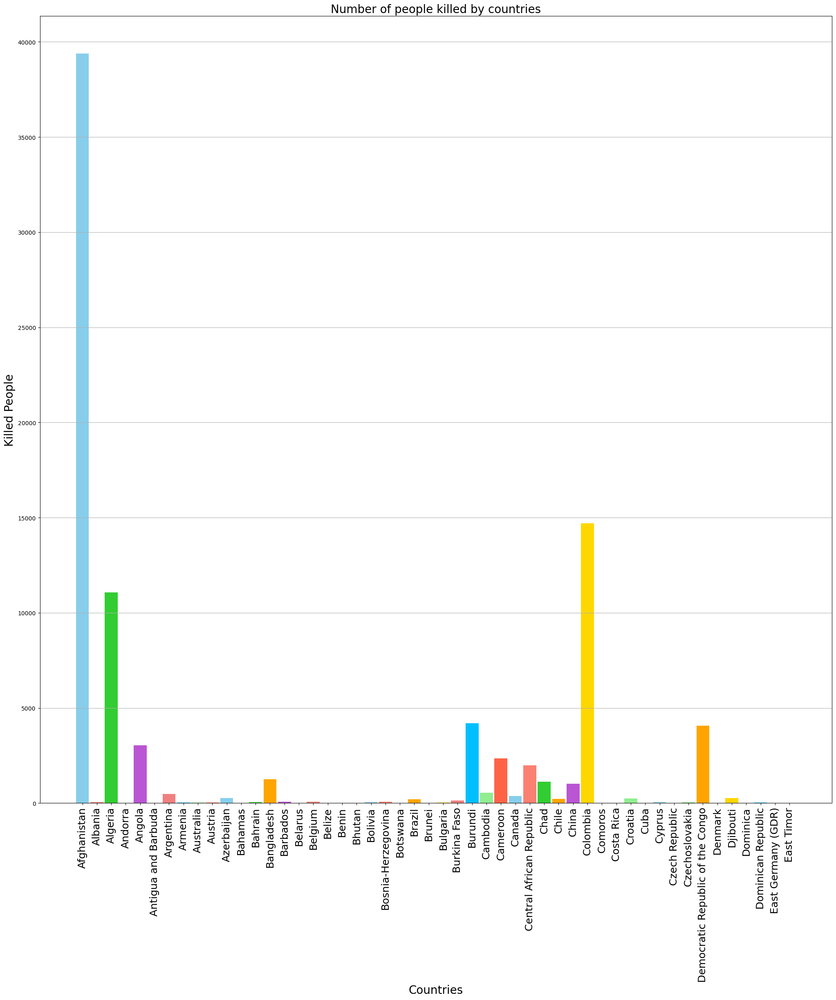

In [41]:
labels = countryKillFormatData.columns[:50].tolist()
index = np.arange(len(labels))
transposed_data = countryKillFormatData.T
values = [int(value[0]) for value in transposed_data.values[:50]]
colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'mediumorchid', 'gold', 'lightcoral', 'deepskyblue', 'lightgreen', 'tomato']
fig, ax = plt.subplots()
ax.yaxis.grid(True)
fig.set_size_inches(25, 25)
ax.bar(index, values, color=colors, width=0.9)
ax.set_ylabel('Killed People', fontsize=20)
ax.set_xlabel('Countries', fontsize=20)
ax.set_title('Number of people killed by countries', fontsize=20)
ax.set_xticks(index)
ax.set_xticklabels(labels, fontsize=18, rotation=90)
plt.show()

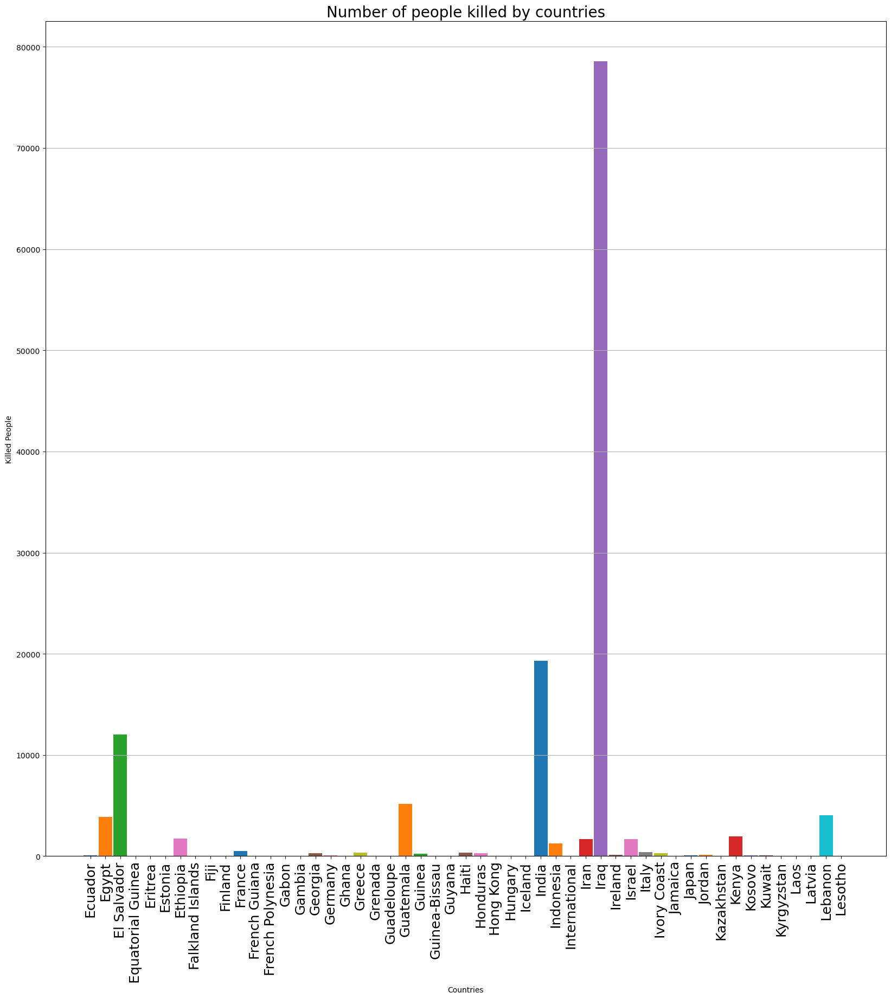

In [44]:
import numpy as np
import matplotlib.pyplot as plt
label_range = slice(50, 101)
labels = countryKillFormatData.columns[label_range].tolist()
index = np.arange(len(labels))
transposed_data = countryKillFormatData.T
values = transposed_data.iloc[label_range, 0].tolist()
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
fig, ax = plt.subplots(1, 1)
ax.yaxis.grid(True)
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 20
fig_size[1] = 20
plt.rcParams["figure.figsize"] = fig_size
plt.bar(index, values, color=colors, width=0.9)
plt.ylabel('Killed People', fontsize=10)
plt.xlabel('Countries', fontsize=10)
plt.xticks(index, labels, fontsize=18, rotation=90)
plt.title('Number of people killed by countries', fontsize=20)
plt.show()


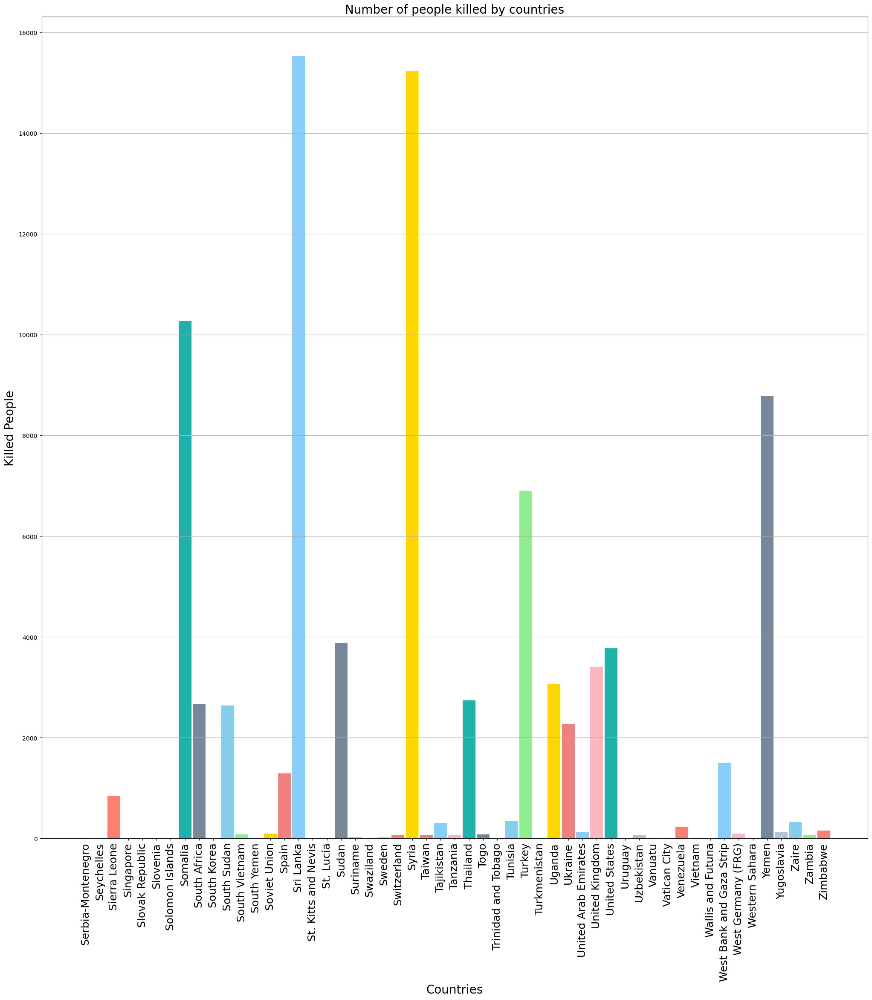

In [43]:
labels = countryKillFormatData.columns[152:206]
index = np.arange(len(labels))
values = countryKillFormatData.T.values[152:206]
values = [int(i[0]) for i in values]
colors = ['skyblue', 'lightgreen', 'salmon', 'gold', 'lightcoral', 'lightskyblue', 'lightpink', 'lightseagreen', 'lightslategray', 'lightsteelblue']
plt.figure(figsize=(25, 25))
plt.bar(index, values, color=colors, width=0.9)
plt.ylabel('Killed People', fontsize=20)
plt.xlabel('Countries', fontsize=20)
plt.xticks(index, labels, fontsize=18, rotation=90)
plt.title('Number of people killed by countries', fontsize=20)
plt.grid(axis='y')  
plt.show()


Terrorist incidents in the Middle East and Northern Africa have been notably devastating. These regions are marked by significant terrorist activity, with Iraq, Afghanistan, and Pakistan emerging as the most heavily affected countries. It's worth noting that despite the common misconception associating Muslims with terrorism, they are often the primary victims of such attacks. As illustrated in the graphics, Muslim-majority nations bear a disproportionate brunt of the damage caused by terrorism.